In [11]:
import sys
IN_COLAB = 'google.colab' in sys.modules


if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

    !pip install --upgrade git+https://github.com/keras-team/keras-cv@v0.6.2 -q

    !unzip /content/drive/MyDrive/train_images.zip

In [12]:
import os
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras

import keras_cv
from utils import EvaluateCOCOMetricsCallback
import utils
from keras_cv import bounding_box
from keras_cv import visualization

In [13]:
SPLIT_RATIO = 0.33
BATCH_SIZE = 4
LEARNING_RATE = 0.01
EPOCH = 5
GLOBAL_CLIPNORM = 10.0

In [14]:
path_synth_train = "train_images/synthetic/train"
path_synth_valid = "train_images/synthetic/valid"
path_real_train = "train_images/real/train"
path_real_valid = "train_images/real/valid"

In [15]:
train_synth_ds,test_synth_ds = utils.prepare_dataset(path_synth_train,True,None)
val_synth_ds= utils.prepare_dataset(path_synth_valid,False,None)

train_real_ds,test_real_ds = utils.prepare_dataset(path_real_train,True,None, grayscale= True)
val_real_ds= utils.prepare_dataset(path_real_valid,False,None, grayscale=True)

108
434
<_BatchDataset element_spec={'images': RaggedTensorSpec(TensorShape([4, None, None, 3]), tf.float32, 2, tf.int64), 'bounding_boxes': {'classes': RaggedTensorSpec(TensorShape([4, None]), tf.float32, 1, tf.int64), 'boxes': RaggedTensorSpec(TensorShape([4, None, None]), tf.float32, 2, tf.int64)}}>
9
40
<_BatchDataset element_spec={'images': RaggedTensorSpec(TensorShape([4, None, None, 3]), tf.float32, 2, tf.int64), 'bounding_boxes': {'classes': RaggedTensorSpec(TensorShape([4, None]), tf.float32, 1, tf.int64), 'boxes': RaggedTensorSpec(TensorShape([4, None, None]), tf.float32, 2, tf.int64)}}>


<tf.RaggedTensor [[], [[94.61145, 262.13806, 138.64178, 274.2448]], [],
 [[183.8551, 371.13428, 223.41058, 379.73547]]]>
<tf.RaggedTensor [[], [[479.9552, 257.4305, 640.0, 285.77408]], [], []]>


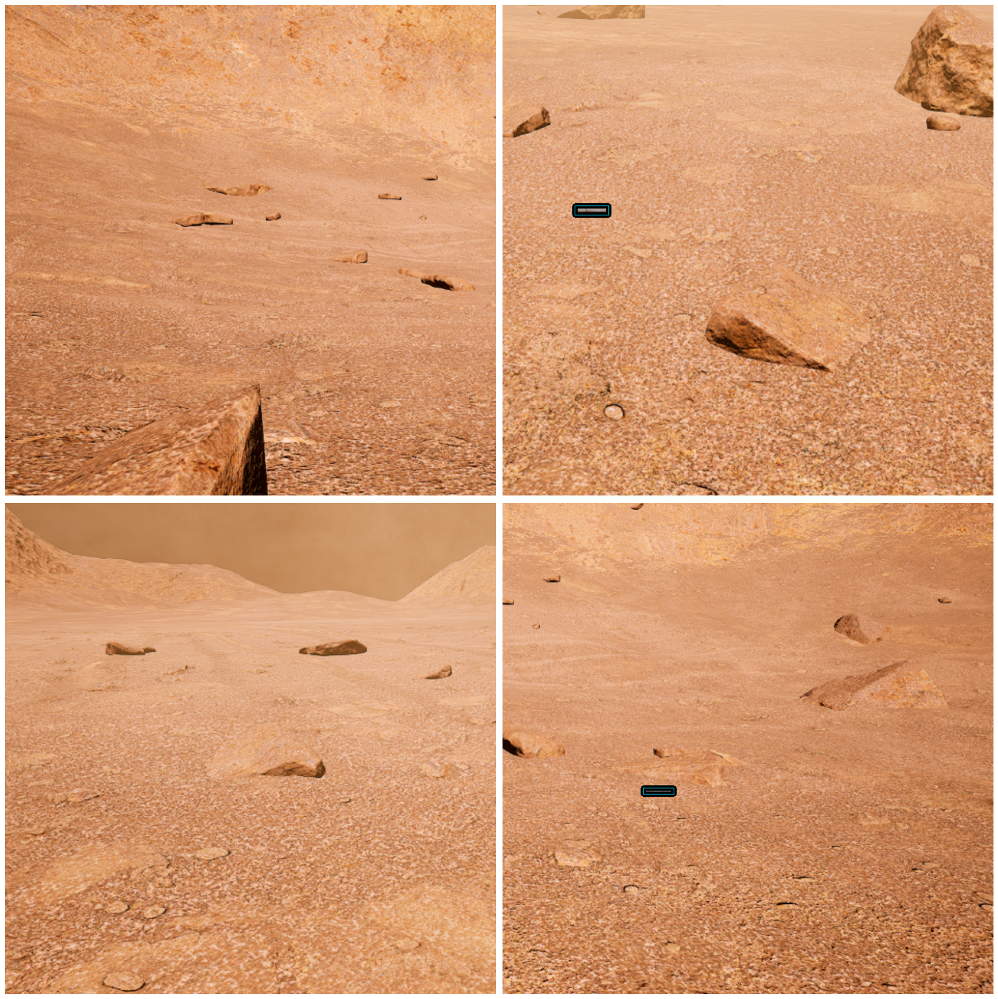

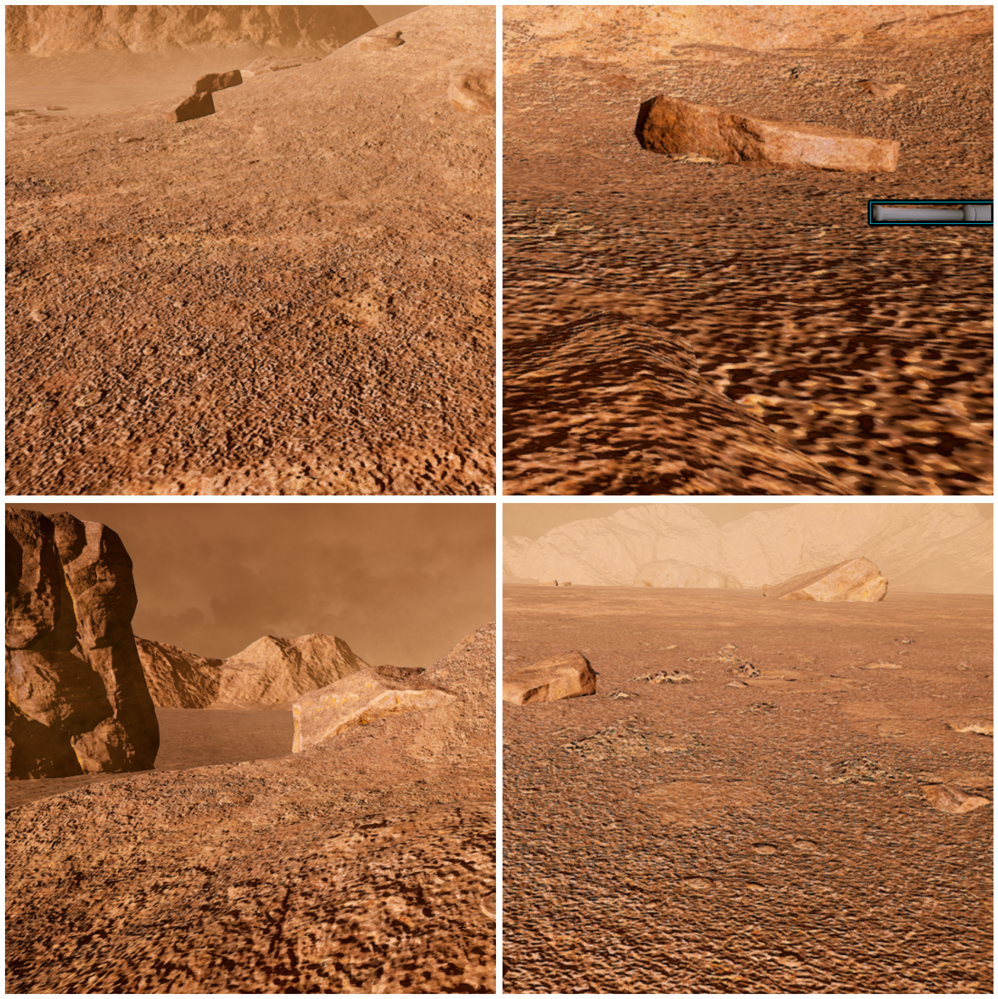

In [6]:
utils.visualize_dataset(
    train_synth_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

utils.visualize_dataset(
    test_synth_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

In [12]:
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    "yolo_v8_s_backbone_coco"  # We will use yolov8 small backbone with coco weights
)

yolo = keras_cv.models.YOLOV8Detector(
    num_classes=1,
    bounding_box_format="xyxy",
    backbone=backbone,
    fpn_depth=1,
)

optimizer = tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE,
    global_clipnorm=GLOBAL_CLIPNORM,
)

yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", box_loss="ciou"
)

In [ ]:
def scheduler(epoch, lr):
    if epoch < 10:
      return lr
    else:
      return lr * tf.math.exp(-0.1)

In [23]:
history = yolo.fit(
    train_synth_ds,
    validation_data=test_synth_ds,
    epochs=20,
    callbacks=[EvaluateCOCOMetricsCallback(val_synth_ds, "model.h5"), scheduler,keras.metrics.Precision(), keras.metrics.Recall()],
    use_multiprocessing=True,
    workers = -1
)

Epoch 1/20
108/108 [==============================] - ETA: 0s - loss: 1008.7839 - box_loss: 3.3749 - class_loss: 1005.4089

108/108 [==============================] - 96s 451ms/step - loss: 1008.7839 - box_loss: 3.3749 - class_loss: 1005.4089 - val_loss: 2.8587 - val_box_loss: 1.1356 - val_class_loss: 1.7231 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0000e+00 - Recall@[max_detections=100]: 0.0000e+00 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00
Epoch 2/20
108/108 [==============================] - 46s 421ms/step - loss: 8.7674 - box_loss: 3.8869 - class_loss: 4.8805 - val_loss: 8.3250 - val_box_loss: 3.4661 - val_class_loss: 4.8589 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=

108/108 [==============================] - 46s 426ms/step - loss: 6.6254 - box_loss: 4.0609 - class_loss: 2.5645 - val_loss: 5.7140 - val_box_loss: 4.0041 - val_class_loss: 1.7100 - MaP: 0.0814 - MaP@[IoU=50]: 0.2865 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0933 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.1467 - Recall@[max_detections=10]: 0.1667 - Recall@[max_detections=100]: 0.1667 - Recall@[area=small]: 0.1923 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00
Epoch 11/20
108/108 [==============================] - 42s 385ms/step - loss: 5.6714 - box_loss: 3.9504 - class_loss: 1.7211 - val_loss: 5.6013 - val_box_loss: 3.8164 - val_class_loss: 1.7849 - MaP: 0.0528 - MaP@[IoU=50]: 0.2335 - MaP@[IoU=75]: 0.0012 - MaP@[area=small]: 0.0546 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.1679 - Recall@[max_detections=10]: 0.2143 - Recall@[max_detections=100]: 0.2143 - R

108/108 [==============================] - 51s 460ms/step - loss: 4.7852 - box_loss: 3.3718 - class_loss: 1.4134 - val_loss: 4.9683 - val_box_loss: 3.5856 - val_class_loss: 1.3827 - MaP: 0.1010 - MaP@[IoU=50]: 0.3693 - MaP@[IoU=75]: 0.0075 - MaP@[area=small]: 0.1103 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.1610 - Recall@[max_detections=10]: 0.2512 - Recall@[max_detections=100]: 0.2512 - Recall@[area=small]: 0.2711 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00
Epoch 17/20
108/108 [==============================] - ETA: 0s - loss: 4.6552 - box_loss: 3.2761 - class_loss: 1.3791

108/108 [==============================] - 47s 429ms/step - loss: 4.6552 - box_loss: 3.2761 - class_loss: 1.3791 - val_loss: 4.6671 - val_box_loss: 3.2691 - val_class_loss: 1.3980 - MaP: 0.1654 - MaP@[IoU=50]: 0.5311 - MaP@[IoU=75]: 0.0223 - MaP@[area=small]: 0.1654 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.2778 - Recall@[max_detections=10]: 0.2963 - Recall@[max_detections=100]: 0.2963 - Recall@[area=small]: 0.2963 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00
Epoch 18/20
108/108 [==============================] - ETA: 0s - loss: 4.2669 - box_loss: 3.0698 - class_loss: 1.1971

108/108 [==============================] - 44s 405ms/step - loss: 4.2669 - box_loss: 3.0698 - class_loss: 1.1971 - val_loss: 4.4998 - val_box_loss: 3.1173 - val_class_loss: 1.3826 - MaP: 0.2069 - MaP@[IoU=50]: 0.6272 - MaP@[IoU=75]: 0.0429 - MaP@[area=small]: 0.2153 - MaP@[area=medium]: 0.1010 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.2900 - Recall@[max_detections=10]: 0.3433 - Recall@[max_detections=100]: 0.3433 - Recall@[area=small]: 0.3607 - Recall@[area=medium]: 0.1000 - Recall@[area=large]: 0.0000e+00
Epoch 19/20
108/108 [==============================] - ETA: 0s - loss: 4.2425 - box_loss: 2.9901 - class_loss: 1.2524

108/108 [==============================] - 48s 438ms/step - loss: 4.2425 - box_loss: 2.9901 - class_loss: 1.2524 - val_loss: 4.3338 - val_box_loss: 3.0062 - val_class_loss: 1.3276 - MaP: 0.2654 - MaP@[IoU=50]: 0.7401 - MaP@[IoU=75]: 0.0667 - MaP@[area=small]: 0.2755 - MaP@[area=medium]: 0.1010 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.3313 - Recall@[max_detections=10]: 0.3750 - Recall@[max_detections=100]: 0.3750 - Recall@[area=small]: 0.3933 - Recall@[area=medium]: 0.1000 - Recall@[area=large]: 0.0000e+00
Epoch 20/20
108/108 [==============================] - ETA: 0s - loss: 4.0499 - box_loss: 2.8636 - class_loss: 1.1862

108/108 [==============================] - 52s 478ms/step - loss: 4.0499 - box_loss: 2.8636 - class_loss: 1.1862 - val_loss: 4.1236 - val_box_loss: 2.8333 - val_class_loss: 1.2903 - MaP: 0.3608 - MaP@[IoU=50]: 0.8779 - MaP@[IoU=75]: 0.0699 - MaP@[area=small]: 0.3574 - MaP@[area=medium]: 0.4505 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.4225 - Recall@[max_detections=10]: 0.4525 - Recall@[max_detections=100]: 0.4525 - Recall@[area=small]: 0.4526 - Recall@[area=medium]: 0.4500 - Recall@[area=large]: 0.0000e+00


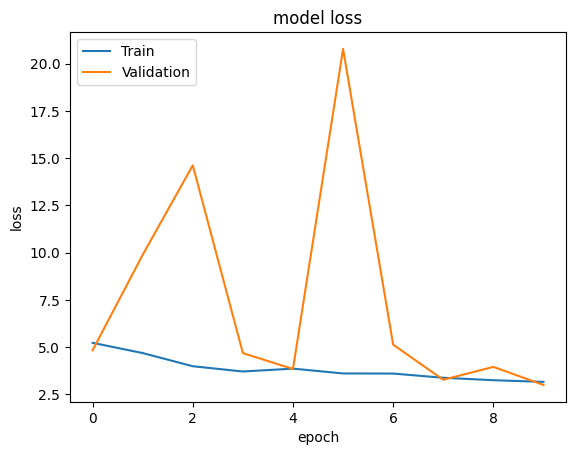

In [19]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

1/1 [==============================] - 2s 2s/step


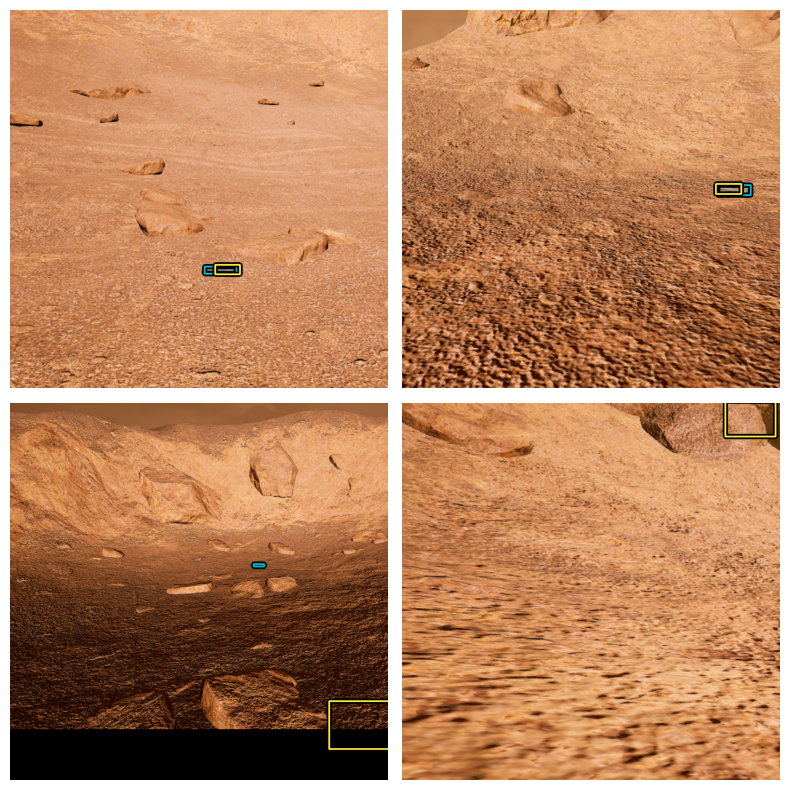

In [14]:
prediction_decoder = keras_cv.layers.MultiClassNonMaxSuppression(
    bounding_box_format="xyxy",
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
    max_detections=1
)
yolo.prediction_decoder = prediction_decoder

utils.visualize_detections(yolo, dataset=val_synth_ds, bounding_box_format="xyxy")


In [ ]:
len(backbone.layers)

for layer in yolo.layers[0:backbone.layers-1]:
    layer.trainable = True

In [ ]:
history = yolo.fit(
    train_real_ds,
    validation_data=test_real_ds,
    epochs=20,
    callbacks=[EvaluateCOCOMetricsCallback(val_real_ds, "model.h5"), scheduler],
    use_multiprocessing=True,
    workers = -1
)

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
prediction_decoder = keras_cv.layers.MultiClassNonMaxSuppression(
    bounding_box_format="xyxy",
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
    max_detections=1
)
yolo.prediction_decoder = prediction_decoder

utils.visualize_detections(yolo, dataset=val_synth_ds, bounding_box_format="xyxy")